# Initial Setup and Data Preparation:

## Setting up environment

Introduce the dependency so that the user can setup in advance

## Setting the file root folder path

In [1]:
# mount the folder from the cloud location if using the google colab
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# set to google drive location by default
file_root_path = '/content/drive/MyDrive/Denoising Code/Denoising_Tutorial'

# if the files are in local devices, change the file_root_path to the local location


In [3]:
import os
import sys

sys.path.append(file_root_path)

In [4]:
# if using mac, please run `brew install svn` to use svn

# ! svn export https://github.com/LabForComputationalVision/bias_free_denoising/trunk/data/Train400

In [5]:
path_to_image_data = file_root_path + '/Train400'

In [6]:
noise_scale = noise_std = 0.17 # 20 -40/ 255

In [7]:
import os

path_to_saved_models = file_root_path + '/image_wavelet/saved_models_natural_image/'
if not os.path.exists(path_to_saved_models):
    os.mkdir(path_to_saved_models)

In [8]:
import os

from PIL import Image

import numpy as np
from torch.utils.data import DataLoader
import torch
import matplotlib.pyplot as plt

import cv2
# from skimage.measure.simple_metrics import compare_psnr
from skimage.metrics import peak_signal_noise_ratio as compare_psnr
import glob
import pickle

import torch.nn.functional as F
import torch.nn as nn
import torch.optim as optim
import argparse
import sys
import torchvision
import torch
from torch.serialization import default_restore_location
from torch.distributions import Poisson
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
sys.path.append(file_root_path + '/electron-microscopy-denoising')
import data
import models
import utils

In [9]:
device = torch.device('cpu')

In [10]:
kernel_size = 2
# noise_std_array = [float(10)/255, float(25)/255, float(55)/255];

n_examples = 3 #number of examples to plot

In [11]:
import sys
sys.path.append(file_root_path + '/image_wavelet')
sys.path.append(file_root_path + '/image_wavelet/multiscale_py/')

import image_dataset
import haar_soft_threshold_2d_net
import linearcnn

In [12]:
net = linearcnn.linearcnn(kernel_size=3);

1


## Creating Dataloader

n_val random images are set for validation while rest of the images are in training

In [13]:
n_val = 25;
files_source = glob.glob(os.path.join(path_to_image_data, '*.png'))
files_source = np.sort(files_source)
list_val_images = files_source[-n_val:]
list_train_images = list( set(files_source) - set(list_val_images));

In [14]:
list_train_images

['/content/drive/MyDrive/Denoising Code/Denoising_Tutorial/Train400/test_031.png',
 '/content/drive/MyDrive/Denoising Code/Denoising_Tutorial/Train400/test_243.png',
 '/content/drive/MyDrive/Denoising Code/Denoising_Tutorial/Train400/test_077.png',
 '/content/drive/MyDrive/Denoising Code/Denoising_Tutorial/Train400/test_055.png',
 '/content/drive/MyDrive/Denoising Code/Denoising_Tutorial/Train400/test_179.png',
 '/content/drive/MyDrive/Denoising Code/Denoising_Tutorial/Train400/test_073.png',
 '/content/drive/MyDrive/Denoising Code/Denoising_Tutorial/Train400/test_156.png',
 '/content/drive/MyDrive/Denoising Code/Denoising_Tutorial/Train400/test_021.png',
 '/content/drive/MyDrive/Denoising Code/Denoising_Tutorial/Train400/test_360.png',
 '/content/drive/MyDrive/Denoising Code/Denoising_Tutorial/Train400/test_361.png',
 '/content/drive/MyDrive/Denoising Code/Denoising_Tutorial/Train400/test_002.png',
 '/content/drive/MyDrive/Denoising Code/Denoising_Tutorial/Train400/test_129.png',
 '/c

In [15]:
train_dataset = image_dataset.Dataset(list_train_images,
                                         resize_to_256 = True)
val_dataset = image_dataset.Dataset(list_val_images,
                                       resize_to_256 = True)

train_loader = DataLoader(dataset=train_dataset,
                          num_workers=0,
                          batch_size=4, shuffle=True);

val_loader = DataLoader(dataset = val_dataset,
                       num_workers = 0,
                       batch_size = 4,
                       shuffle = True)

In [16]:
train_dataset = train_loader.dataset
val_dataset = val_loader.dataset
test_loader = val_loader
test_dataset = test_loader.dataset

In [17]:
train_loader.batch_size

4

In [18]:
len(train_dataset)

375

In [19]:
len(test_dataset)

25

In [20]:
# val_dataset[1]['image'].size()

In [21]:
# test_dataset[1]['image'].size()

## Image Statstics

In [22]:
def find_expected_coeff_square(train_dataset):
    n = len(train_dataset)
    abs_coeff_mat = 0;

    for i in range(n):
        temp = np.fft.fftshift( np.fft.fft2(train_dataset[i].data[0].numpy() ) )
        abs_coeff_mat += (np.absolute(temp) ** 2)

    abs_coeff_mat /= n

    return abs_coeff_mat

def plot_matrix_color_and_numbers(ax = None, matrix = None, display_num = False, figsize = (20, 5), title_string = None, ax_off = False):

    if ax is None:
        fig, ax = plt.subplots(1, 1, sharex=False, sharey=False, figsize=figsize);

    img_display = ax.matshow( matrix, cmap=plt.cm.Blues)

    if(display_num):
        for i in range(matrix.shape[1]):
            for j in range(matrix.shape[0]):
                c = matrix[j,i]
                ax.text(i, j, "{:.2f}".format(c), va='center', ha='center')

    ax.set_xlabel('Min: '+ "{:.2f}".format(np.min(matrix)) + ' Max: '+ "{:.2f}".format(np.max(matrix)) +' Mean: ' + "{:.2f}".format(np.mean(matrix)))

    if title_string is not None:
        ax.set_title(title_string)

    if ax_off:
        ax.axis('off')

    return img_display


In [23]:
mean_coeff_sq = find_expected_coeff_square(train_dataset)

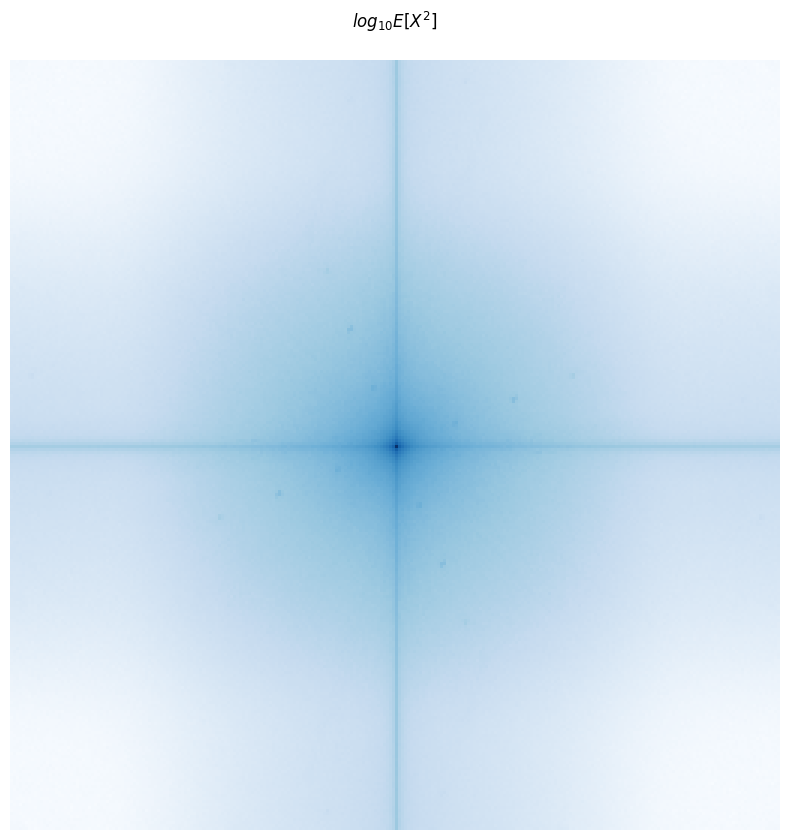

In [24]:
plot_matrix_color_and_numbers(ax = None, matrix = np.log10(mean_coeff_sq), display_num=False, title_string='$log_{10}E[X^2]$', figsize=(10, 10), ax_off = True)

In [25]:
def convert_2d_plot_to_1d(abs_coeff_mat):

    zero_x = abs_coeff_mat.shape[0]//2;
    zero_y = abs_coeff_mat.shape[1]//2;

    f_array = np.zeros(abs_coeff_mat.shape[0] * abs_coeff_mat.shape[1]);
    coeff_array = np.zeros(abs_coeff_mat.shape[0] * abs_coeff_mat.shape[1]);
    for i in range(abs_coeff_mat.shape[0]):
        for j in range(abs_coeff_mat.shape[1]):
            f_array[i*abs_coeff_mat.shape[1] + j] = np.sqrt((i-zero_x)**2 + (j-zero_y)**2);
            coeff_array[i*abs_coeff_mat.shape[1] + j] = abs_coeff_mat[i, j]

    sort_idx = np.argsort(f_array)
    coeff_array =  coeff_array[sort_idx]
    f_array = f_array[sort_idx]

    unique_f = np.unique(f_array)
    m = len(unique_f);

    unique_coeff = np.zeros(m);

    for i, x in enumerate(unique_f):
        same_idx = np.where(unique_f == x)[0];
        unique_coeff[i] = np.mean(coeff_array[same_idx]);

    return unique_f, unique_coeff

In [26]:
f_1d, mean_sq_coeff_1d = convert_2d_plot_to_1d(mean_coeff_sq);

Text(0.5, 1.0, '$log_{10}E[X^2]$ in 1D')

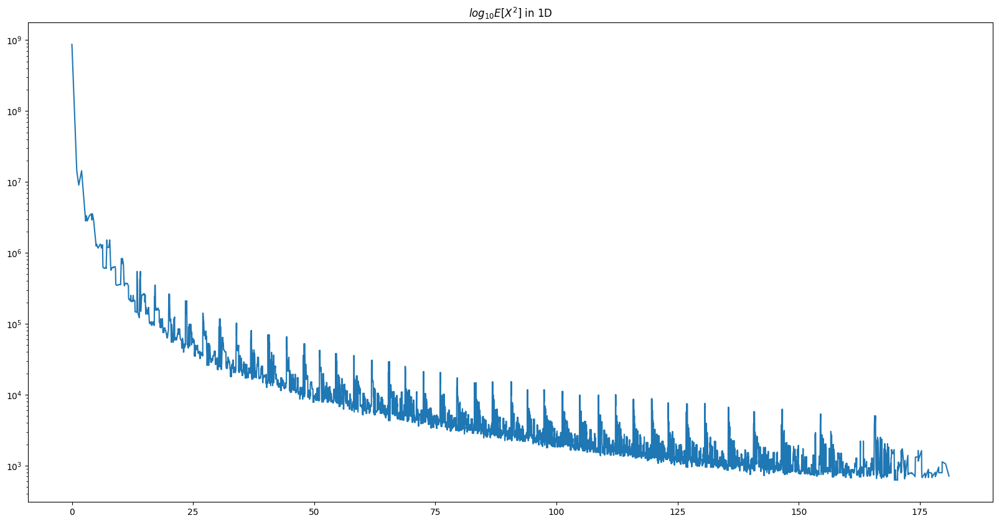

In [27]:
plt.figure(figsize = (20, 10))
plt.semilogy(f_1d, mean_sq_coeff_1d)
plt.title('$log_{10}E[X^2]$ in 1D')

## Visualization Before Training

In [28]:
def batch_PSNR(img, imclean, data_range):
    Img = img.data.cpu().numpy().astype(np.float32)
    Iclean = imclean.data.cpu().numpy().astype(np.float32)
    PSNR = 0
    for i in range(Img.shape[0]):
        PSNR += compare_psnr(Iclean[i,:,:,:], Img[i,:,:,:], data_range=data_range)
    return (PSNR/Img.shape[0])

In [29]:
def normalize(data):
    return data/255.

def get_test_image(path_to_dataset, index):
    files_source = glob.glob(os.path.join(path_to_dataset, '*.png'))
    files_source.sort()

    f = files_source[index];

    Img = cv2.imread(f)
    Img = normalize(np.float32(Img[:,:,0]))
    Img = np.expand_dims(Img, 0)
    Img = np.expand_dims(Img, 1)
    ISource = torch.Tensor(Img).to(device)

    return ISource


In [30]:
from torch.distributions import Poisson

In [31]:
def tensor_to_image(torch_image, low=0.0, high = 1.0, clamp = True):
    if clamp:
        torch_image = torch.clamp(torch_image, low, high);
    return torch_image[0,0].cpu().data.numpy()

In [32]:
def plot_2d_log_fft(image, ax = None, ax_off = True, title_string = None):
    fft = np.fft.fftshift( np.fft.fft2(image) );
    mat = np.log10( np.abs(fft) + 1e-9)

    if title_string is None:
        return plot_matrix_color_and_numbers(ax = ax, matrix=mat, display_num=False, ax_off = ax_off)
    else:
        return plot_matrix_color_and_numbers(ax = ax, matrix=mat, display_num=False, title_string = title_string, ax_off = ax_off)


In [33]:


def get_noise(data, noise_std = 0.1, mode='poisson', max_noise = 5e-1, noise_scale=50):

    noise = get_noise_others(data, noise_std, mode, max_noise)
    return noise

def get_noise_others(data, noise_std = 0.1, mode='S', max_noise = 5e-1):
    noise = torch.randn_like(data);
    if mode == 'B':
        n = noise.shape[0];
        noise_tensor_array = max_noise * torch.rand(n);
        for i in range(n):
            noise.data[i] = noise.data[i] * noise_tensor_array[i];
    else:
        noise.data = noise.data * noise_std;
    return noise

In [34]:
from torch.distributions import Poisson
import matplotlib.pyplot as plt
# Assume tensor_to_image, plot_2d_log_fft, and batch_PSNR are defined elsewhere

def visualize_denoising(source, net, noise_std=0.1, noise_sample=None, noise_scale=1.0, figsize=(20, 20)):
    fig, axes = plt.subplots(2, 3, sharex=True, sharey='row', figsize=figsize)
    print(source)

    axes[0, 0].imshow(tensor_to_image(source), cmap='gray')
    print(tensor_to_image(source))
    axes[0, 0].axis('off')
    plot_2d_log_fft(tensor_to_image(source), axes[1, 0])

    print(source[0, 0].size())

    if noise_sample is None:
        noisy  = source + get_noise(source, noise_std=noise_std,noise_scale = noise_scale)

    axes[0, 1].imshow(tensor_to_image(noisy), cmap='gray')
    axes[0, 1].axis('off')
    axes[0, 1].set_title(str(batch_PSNR(noisy, source, 1.0)))
    plot_2d_log_fft(tensor_to_image(noisy), axes[1, 1])

    denoised = net(noisy)

    axes[0, 2].imshow(tensor_to_image(denoised), cmap='gray')
    axes[0, 2].axis('off')
    axes[0, 2].set_title(str(batch_PSNR(torch.clamp(denoised, 0.0, 1.0), source, 1.0)))
    plot_2d_log_fft(tensor_to_image(denoised), axes[1, 2])

    plt.subplots_adjust(wspace=0, hspace=0)
    plt.show()

# Note: The function now accepts an additional parameter 'noise_scale'
# You can adjust 'noise_scale' to control the level of noise.


In [35]:
val_dataset[0]

tensor([[[0.7255, 0.7342, 0.7584,  ..., 0.3830, 0.6108, 0.8000],
         [0.7820, 0.7956, 0.8242,  ..., 0.3128, 0.4327, 0.5303],
         [0.8325, 0.8460, 0.8750,  ..., 0.2142, 0.2832, 0.3693],
         ...,
         [0.6829, 0.6599, 0.6425,  ..., 0.2585, 0.2504, 0.2384],
         [0.6911, 0.6756, 0.6667,  ..., 0.2457, 0.2384, 0.2314],
         [0.6824, 0.6693, 0.6679,  ..., 0.2403, 0.2335, 0.2314]]])

In [36]:
train_dataset[0].size()

torch.Size([1, 256, 256])

In [37]:
net = linearcnn.linearcnn(kernel_size=3)

1


In [38]:
# noise_scale = noise_std = 1

tensor([[[[0.7255, 0.7342, 0.7584,  ..., 0.3830, 0.6108, 0.8000],
          [0.7820, 0.7956, 0.8242,  ..., 0.3128, 0.4327, 0.5303],
          [0.8325, 0.8460, 0.8750,  ..., 0.2142, 0.2832, 0.3693],
          ...,
          [0.6829, 0.6599, 0.6425,  ..., 0.2585, 0.2504, 0.2384],
          [0.6911, 0.6756, 0.6667,  ..., 0.2457, 0.2384, 0.2314],
          [0.6824, 0.6693, 0.6679,  ..., 0.2403, 0.2335, 0.2314]]]])
[[0.7254902  0.7341912  0.75836396 ... 0.38299632 0.61075366 0.8       ]
 [0.78204656 0.7955739  0.82418215 ... 0.3127937  0.43272346 0.5302696 ]
 [0.8325061  0.84598243 0.875      ... 0.21415228 0.28315502 0.36933213]
 ...
 [0.6828738  0.65986377 0.6424652  ... 0.25854734 0.2504476  0.23844975]
 [0.6910539  0.6755893  0.66666526 ... 0.24568541 0.23837413 0.23137255]
 [0.68235296 0.6693015  0.6679228  ... 0.24034926 0.23354779 0.23137255]]
torch.Size([256, 256])


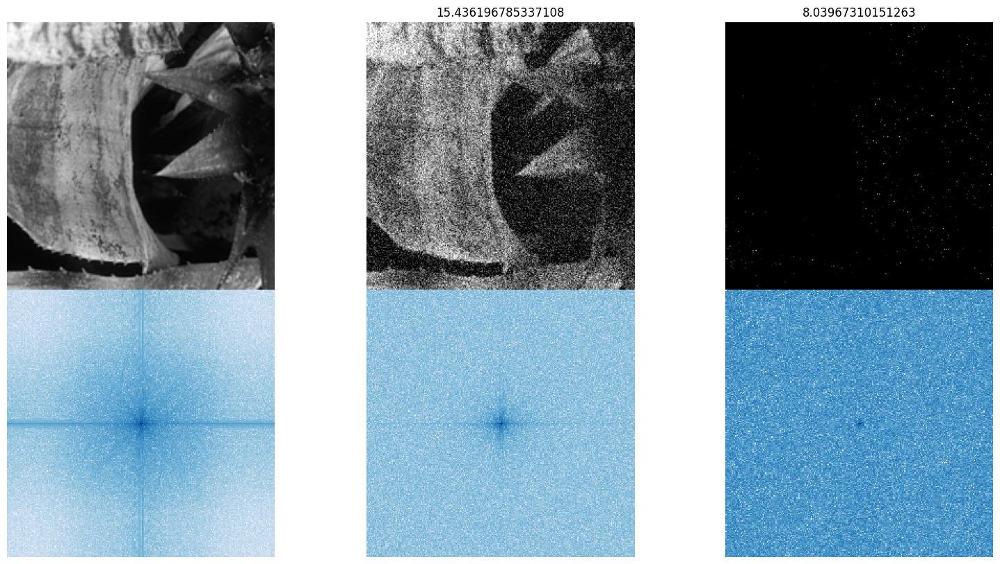

tensor([[[[0.3961, 0.3896, 0.3722,  ..., 0.5601, 0.5578, 0.5686],
          [0.4048, 0.3970, 0.3922,  ..., 0.5945, 0.5766, 0.5730],
          [0.4097, 0.4123, 0.4235,  ..., 0.6230, 0.5945, 0.5765],
          ...,
          [0.7905, 0.8030, 0.7988,  ..., 0.0761, 0.0545, 0.0374],
          [0.7158, 0.7191, 0.7105,  ..., 0.0547, 0.0440, 0.0419],
          [0.6353, 0.6266, 0.6105,  ..., 0.0443, 0.0462, 0.0549]]]])
[[0.39607844 0.3895527  0.3721814  ... 0.56014097 0.55775124 0.5686275 ]
 [0.4047794  0.3970471  0.39216644 ... 0.59452003 0.5765807  0.57297796]
 [0.40974265 0.4122578  0.4235421  ... 0.6230048  0.5945014  0.5764706 ]
 ...
 [0.7905025  0.8029931  0.79883486 ... 0.07612975 0.05448381 0.03743873]
 [0.71577823 0.71914303 0.7105019  ... 0.05472221 0.04400874 0.04185049]
 [0.63529414 0.6265932  0.6105086  ... 0.04427084 0.04620098 0.05490196]]
torch.Size([256, 256])


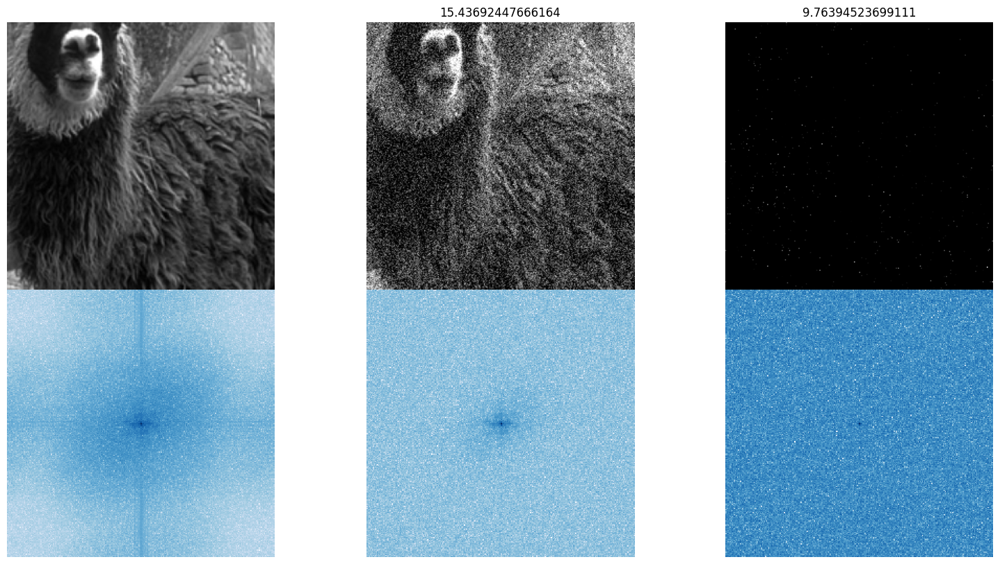

tensor([[[[0.7412, 0.7412, 0.7432,  ..., 0.1282, 0.1460, 0.1569],
          [0.7455, 0.7443, 0.7448,  ..., 0.1375, 0.1486, 0.1547],
          [0.7500, 0.7484, 0.7476,  ..., 0.1460, 0.1516, 0.1560],
          ...,
          [0.2570, 0.2468, 0.2428,  ..., 0.1221, 0.1176, 0.1127],
          [0.2580, 0.2498, 0.2452,  ..., 0.1211, 0.1189, 0.1155],
          [0.2667, 0.2645, 0.2597,  ..., 0.1206, 0.1198, 0.1176]]]])
[[0.7411765  0.7411765  0.7431986  ... 0.12815565 0.14598653 0.15686275]
 [0.74552697 0.7443204  0.74481297 ... 0.13748541 0.14863761 0.15468751]
 [0.75003064 0.7484162  0.7476098  ... 0.14604972 0.1515558  0.15597427]
 ...
 [0.25704658 0.24679913 0.24281389 ... 0.12208994 0.11762576 0.11271446]
 [0.2579657  0.24975754 0.24518205 ... 0.1211184  0.11885364 0.11547182]
 [0.26666668 0.26449144 0.259712   ... 0.1205576  0.1198223  0.11764706]]
torch.Size([256, 256])


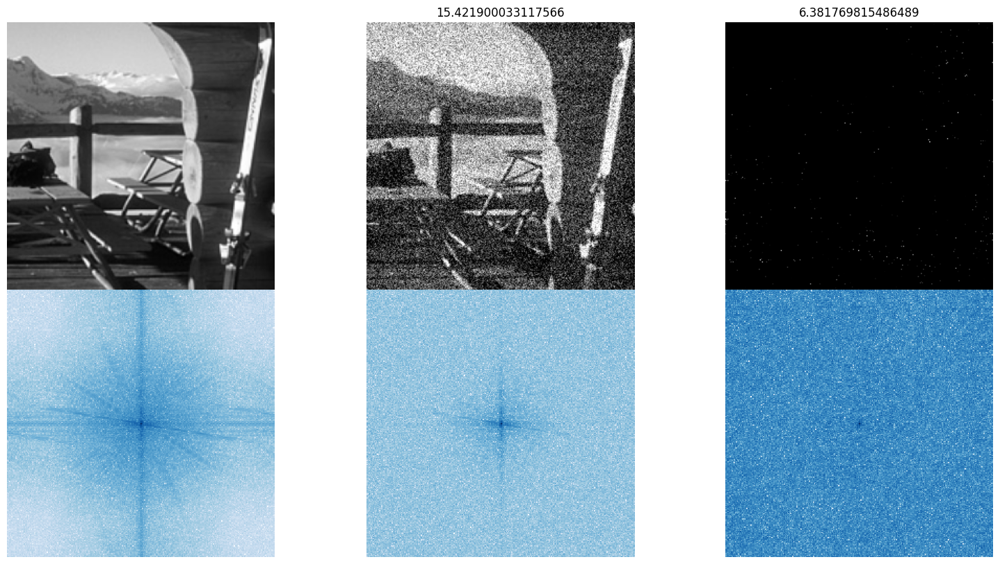

In [39]:
# noise_std = np.random.choice(noise_std_array)
for i in range(n_examples):
    visualize_denoising(val_dataset[i].unsqueeze(0).to(device), net.to(device), noise_std=noise_std, noise_scale=noise_scale, figsize=(20, 10))

# Theoretical Wiener Filter

In [40]:
def plot_matrix_color_and_numbers(ax = None, matrix = None, display_num = False, figsize = (20, 5), title_string = None, ax_off = False):

    if ax is None:
        fig, ax = plt.subplots(1, 1, sharex=False, sharey=False, figsize=figsize);

    image_dispalyed = ax.matshow( matrix, cmap=plt.cm.Blues)

    if(display_num):
        for i in range(matrix.shape[1]):
            for j in range(matrix.shape[0]):
                c = matrix[j,i]
                ax.text(i, j, "{:.2f}".format(c), va='center', ha='center')

    ax.set_xlabel('Min: '+ "{:.2f}".format(np.min(matrix)) + ' Max: '+ "{:.2f}".format(np.max(matrix)) +' Mean: ' + "{:.2f}".format(np.mean(matrix)))

    if title_string is not None:
        ax.set_title(title_string)

    if ax_off:
        ax.axis('off')

    return image_dispalyed

def visualize_filters(net):
    fig, axes = plt.subplots(1, 2, sharex=False, sharey=False, figsize=(20, 5));
    plt.setp(axes.flat,  adjustable='box-forced');

    axes[0].set_title('Filter');
    axes[1].set_title('FFT');

    filter_np = net.first_layer.weight.cpu().data.numpy()[0,0]
    plot_matrix_color_and_numbers(axes[0],
                                  filter_np, net.kernel_size < 6)

    fft_matrix = abs( np.fft.fftshift( np.fft.fft2( filter_np, s=(180,180))) );
    plot_matrix_color_and_numbers(axes[1], fft_matrix, False)


In [41]:
def theoretical_wiener_from_data(train_dataset, fft_shift = True, noise_std=0.1,fft_sample = (256, 256),  n = 10, noise_scale=50):
    mean_coeff = np.fft.fft2(train_dataset[0].numpy()[0], s = fft_sample) * 0;

    for i in range(n):
        for x in train_dataset:
#             print(x)
#             x = x['image']
#             noisy = x + get_noise(x, noise_std=noise_std);
            source = x

            noisy = source+ get_noise(source, mode = 'poisson', noise_std=noise_std, noise_scale=noise_scale);
#             noisy = Poisson(x).sample()
#             print(noisy.size())
            noise_fft = ( np.fft.fft2(noisy.numpy()[0], s = fft_sample) );
            clean_fft = ( np.fft.fft2(x.numpy()[0], s = fft_sample) );

            mean_coeff += clean_fft * np.conjugate(noise_fft) / np.abs(noise_fft+1*10**(-8))**2

    mean_coeff /= n*len(train_dataset)
    if fft_shift:
        return np.fft.fftshift(mean_coeff)
    else:
        return mean_coeff

In [42]:
def plot_filter_and_fft_from_fft(fft_mat, s= 17):
    fig, axes = plt.subplots(1, 2, sharex=False, sharey=False, figsize=(20, 5));

    axes[0].set_title('Filter');
    axes[1].set_title('$log_{10}(FFT)$');

    filter_np = np.real( np.fft.ifft2( np.fft.ifftshift(fft_mat), s = (s, s) ) );

    plot_matrix_color_and_numbers(axes[0],
                                  filter_np, display_num = (s < 7) );


    plot_matrix_color_and_numbers(axes[1], (np.abs(fft_mat)), False);


### Visualizing filters

In [43]:
noise_std

0.17

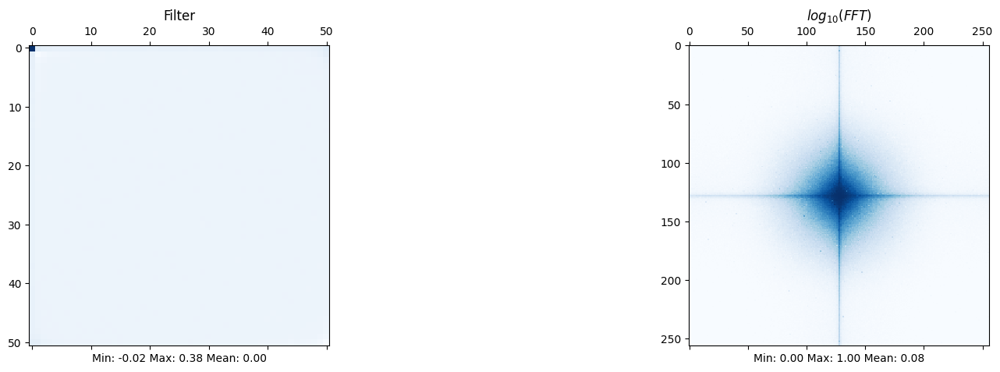

In [44]:
wiener_star = theoretical_wiener_from_data(train_dataset,noise_std=noise_std,noise_scale=noise_scale)
#     wiener_star = theoretical_wiener_from_expected_coeff_sq(mean_coeff_sq, noise_std, len(train_dataset));
plot_filter_and_fft_from_fft(wiener_star, s = 51)
plt.show()

### Visualize Theoretical Wiener Denoising

In [45]:
def best_wiener_loss_and_psnr(val_dataset, wiener_star, fft_sample= (256, 256),noise_std=0.1, noise_scale=50):
    mean_loss = 0;
    mean_psnr = 0;
    mean_noisy_psnr = 0;
    for source in val_dataset:

        noisy = source+ get_noise(source, mode = 'poisson', noise_std=noise_std, noise_scale=noise_scale);

        noisy = noisy.numpy()[0]


        #     noisy = Poisson(source).sample()
        #     noisy = noisy.numpy()[0]
        #     print(noisy.shape)
        source = source.numpy()[0]


        source_fft = np.fft.fftshift( np.fft.fft2(source, s = fft_sample) );
        noisy_fft = np.fft.fftshift( np.fft.fft2(noisy, s = fft_sample) );
        denoised_fft = noisy_fft * wiener_star;

        source_ifft = np.clip( np.real( np.fft.ifft2( np.fft.ifftshift(source_fft), s= fft_sample) ), 0., 1. );
        noisy_ifft = np.clip( np.real(np.fft.ifft2( np.fft.ifftshift( noisy_fft), s = fft_sample)), 0., 1. );
        denoised_ifft = np.clip( np.real( np.fft.ifft2( np.fft.ifftshift(denoised_fft), s = fft_sample)), 0., 1. );

        mean_loss += np.linalg.norm(denoised_ifft - source_ifft)**2;
        mean_psnr += compare_psnr(source_ifft, denoised_ifft, data_range=1.)
        mean_noisy_psnr += compare_psnr(source_ifft, noisy, data_range=1.)

    print(mean_noisy_psnr/len(val_dataset))

    return mean_loss/len(val_dataset), mean_psnr/len(val_dataset)

In [46]:
def visualize_best_wiener_denoising(source, wiener_star, figsize = (20, 10), fft_sample = (256, 256),noise_std=0.1, noise_scale=50):



    noisy = source+ get_noise(source, mode = 'poisson',noise_std=noise_std, noise_scale=noise_scale);

    noisy = noisy.numpy()[0]

    source = source.numpy()[0]

    source_fft = np.fft.fftshift( np.fft.fft2(source, s = fft_sample) );
    noisy_fft = np.fft.fftshift( np.fft.fft2(noisy, s = fft_sample) );
    denoised_fft = noisy_fft * wiener_star;

    source_ifft = np.clip( np.real( np.fft.ifft2( np.fft.ifftshift(source_fft), s= fft_sample) ), 0., 1. );
    noisy_ifft = np.clip( np.real(np.fft.ifft2( np.fft.ifftshift( noisy_fft), s = fft_sample)), 0., 1. );
    denoised_ifft = np.clip( np.real( np.fft.ifft2( np.fft.ifftshift(denoised_fft), s = fft_sample)), 0., 1. );

    fig, axes = plt.subplots(2, 3, sharex=True, sharey='row', figsize=figsize);
    axes[0, 0].imshow( source_ifft, cmap = 'gray' )
    axes[0, 0].axis('off')
    plot_2d_log_fft(source_ifft, axes[1, 0]);

    axes[0,1].imshow( noisy_ifft, cmap='gray' )
    axes[0,1].set_title(str( compare_psnr(source_ifft, noisy_ifft, data_range=1.)) )
    axes[0,1].axis('off')
    plot_2d_log_fft(noisy_ifft, axes[1, 1]);


    axes[0,2].imshow(denoised_ifft, cmap = 'gray')
    axes[0,2].set_title(str( compare_psnr(source_ifft, denoised_ifft, data_range=1.)) )
    axes[0,2].axis('off')
    plot_2d_log_fft(denoised_ifft, axes[1, 2]);

    plt.subplots_adjust(wspace=0, hspace=0)

    plt.show()

### Performance of Theoretical Wiener

In [47]:
# wiener_star_psnr_val_dict = {}
# for noise_std in noise_std_array:
# print('noise std: ', noise_std)
wiener_star_loss, wiener_star_psnr = best_wiener_loss_and_psnr(val_dataset, wiener_star, fft_sample = (256, 256),noise_std=noise_std, noise_scale=noise_scale)
print('Loss: ', wiener_star_loss)
print('PSNR: ', wiener_star_psnr)
# wiener_star_psnr_val_dict[noise_std] = wiener_star_psnr
print('='*50 + '\n')

15.387920876167122
Loss:  193.92846678743956
PSNR:  25.796300438946346



# One layer CNN without the nolinear activation function

Here we show that one layer CNN without nonlinear layers can not outperform Wiener filter. This was put into a wavelet framework and optimized over a dataset to minimize the mean squared error. Please look into the the folder `multiscale_py` for details on implementation

### Training

In [56]:
def validation_error_psnr(model, dataset_val, add_noise = False, noise_mode = 'poisson', noise_std=0.1, max_noise = 5e-1, noise_scale=50):
    model.eval()
    error_val = 0;
    psnr_val = 0;
    total_length = 0;

    criterion = nn.MSELoss(reduction = 'sum');

    for data in dataset_val:
#         data = data['image']
#         data = data.resize((256,256))
        target = data.clone()

        if add_noise:

            data = data + get_noise(data, mode = noise_mode,noise_std=noise_std, max_noise = max_noise, noise_scale=noise_scale)

        data = data.to(device)
        target = target.to(device)
        out_val = model( data );

        error_val += criterion(out_val, target).item()
        psnr_val += ( batch_PSNR(out_val, target, 1.0) * data.shape[0] )
        total_length += data.shape[0];

    return error_val/total_length, psnr_val/total_length

In [57]:
def train_network_on_noise(model, train_loader, val_loader,
                            add_noise = False, noise_mode = 'poisson', max_noise = 5e-1, noise_std = 0.1,
                            max_epoch = 50,  milestone = 50, lr=0.001, plot_loss = True, verbose = False,
                            verbose_freq = 100, early_stopping = True, noise_scale=50):
    model = model.to(device)

    optimizer = optim.Adam( filter(lambda p: p.requires_grad, model.parameters()) , lr=lr);
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'max', patience = 5, factor = 0.5)
    criterion = nn.MSELoss()

    train_loss = np.zeros(max_epoch);
    val_loss = np.zeros(max_epoch);

    train_psnr = np.zeros(max_epoch);
    val_psnr = np.zeros(max_epoch);

    best_model = None;
    best_val_loss = np.inf;

    for epoch in range(max_epoch):

#         if epoch > milestone:
#             for param_group in optimizer.param_groups:
#                 param_group["lr"] = lr/10;

        for i, data in enumerate(train_loader):
            optimizer.zero_grad();
            model.train();
#             data = data['image']
            target = data.clone();

            if add_noise:
#                 data = Poisson(data).sample()
                data = data + get_noise(data, mode = noise_mode,noise_std=noise_std, max_noise = max_noise, noise_scale=noise_scale)

            data = data.to(device)
            target = target.to(device)

            out_train = model(data);
            loss = criterion(out_train, target);
            loss.backward()
            optimizer.step()

        train_loss[epoch], train_psnr[epoch] = validation_error_psnr(model, train_loader,
                                                                add_noise = add_noise);
        val_loss[epoch], val_psnr[epoch] = validation_error_psnr(model, val_loader,
                                                            add_noise = add_noise);
        scheduler.step(val_psnr[epoch])

        if (epoch+1) % verbose_freq == 0 and verbose:
            print(epoch+1, 'train error: ', train_loss[epoch],
                             'val error: ', val_loss[epoch],
                              'train psnr: ', train_psnr[epoch],
                             'val psnr: ', val_psnr[epoch]);

        if val_loss[epoch] < best_val_loss:
            best_model = model.state_dict();
            best_val_loss = val_loss[epoch]

    if early_stopping:
        model.load_state_dict(best_model)

    if plot_loss:
        plt.semilogy(np.arange(1, max_epoch+1), train_loss, label = 'train loss');
        plt.semilogy(np.arange(1, max_epoch+1), val_loss, label = 'val loss')
        plt.legend()
        plt.show()

        plt.plot(np.arange(1, max_epoch+1), train_psnr, label = 'train psnr');
        plt.plot(np.arange(1, max_epoch+1), val_psnr, label = 'val psnr')
        plt.legend()
        plt.show()

    return model, train_psnr, val_psnr

In [58]:
kernel_size_list = [9]; # increase to 8 or 9
onelayer_net_dict = {};

In [59]:
validation_dict = {}
# noise_std_array = [float(10)/255];

# for noise_std in noise_std_array:
# validation_dict[noise_std] ={}
# print('='*50)
# print('noise std: ', noise_std);

string_noise_scale = str(int(noise_scale))

net_dict_filename = 'onelayercnn_natural'+string_noise_scale+'.pth';

if os.path.exists(os.path.join(path_to_saved_models, net_dict_filename)):
    net_dict = pickle.load( open( os.path.join(path_to_saved_models, net_dict_filename), "rb" ) )
    onelayer_net_dict[noise_scale] = net_dict
    print('load pretained')

else:


    net_dict = {}
    print('Training..')
    for kernel_size in kernel_size_list:
        print(kernel_size)
        net_temp = linearcnn.linearcnn(kernel_size=kernel_size).to(device);

        net_temp, train_psnr_tmpt, val_psnr_tmpt = train_network_on_noise(net_temp, train_loader, val_loader,
                                add_noise = True,
                                noise_mode = 'poisson',
                                max_epoch = 30,
                                milestone = 100,
                                lr = 1e-1,
                                verbose = True,
                                verbose_freq = 5,
                                plot_loss = True)
    #             visualize_filters(net_temp)
        validation_dict[kernel_size] = val_psnr_tmpt
        plt.show()
        print('='*50)
        net_dict[kernel_size] = net_temp;
        pickle.dump(net_dict, open( os.path.join(path_to_saved_models, net_dict_filename), "wb" ) )
    onelayer_net_dict[noise_scale] = net_dict
    kernal_size = 3
    max_epoch=30
    # for noise_std in noise_std_array:
    validation_dict[kernal_size]
    plt.plot(np.arange(1, max_epoch+1), validation_dict[kernel_size_list[0]], label = 'kernal_size' + str(kernel_size_list[0]))
    plt.axhline(y=wiener_star_psnr, color="red", linestyle="-", label = 'wiener')
    plt.xlabel('training epochs')
    plt.ylabel('validation psnr')
    #     plt.title('noise level ' + str(noise_std))
    plt.legend()
    plt.show()

load pretained


In [ ]:
# pickle.dump(net_dict, open( os.path.join(path_to_saved_models, net_dict_filename), "wb" ) )

### Val MSE and PNR for different kernel size

In [ ]:
best_kernel_size = {};
# kernel_size_list = [3]
# for noise_std in noise_std_array:

# print('noise std: ', noise_std)
best_kernel_psnr = 0;
best_kernel = 0;
for kernel_size in kernel_size_list:
    val_loss, val_psnr= validation_error_psnr(net_dict[kernel_size], val_loader,
                                                            add_noise = True);
    print('Kernel Size: ', kernel_size, 'Val MSE: ', val_loss, 'Val PSNR: ', val_psnr)
#         visualize_filters(net_dict[kernel_size])
    plt.show()
    if val_psnr > best_kernel_psnr:
        best_kernel_psnr = val_psnr;
        best_kernel = kernel_size;

best_kernel_size = best_kernel;
print('='*50 + '\n\n')

Kernel Size:  9 Val MSE:  403.48398681640623 Val PSNR:  22.3493628921285




# DNN training: DnCNN

It is recommended to skip this process if GPU is not avaible, please load the provided pretrained model

## Setting the device (GPU or CPU)

In [ ]:
USE_CUDA = True
device = torch.device("cuda") if (
        torch.cuda.is_available() and USE_CUDA) else torch.device("cpu")

In [ ]:
# USE_CUDA = False
# device = torch.device("cuda") if (
#         torch.cuda.is_available() and USE_CUDA) else torch.device("cpu")

## Train supervised model

In [52]:
from utils import *

In [53]:
pretrained_base = file_root_path + '/bias_free_denoising/pretrained/'
precomputed_base = file_root_path + '/bias_free_denoising/precomputed/'
data_base = file_root_path + '/bias_free_denoising/data/'


In [ ]:
def load_model_from_scratch(checkpoint_path):
    state_dict = torch.load(checkpoint_path, map_location=lambda s, l: default_restore_location(s, "cpu"))
    args = argparse.Namespace(**{ **vars(state_dict["args"]), "no_log": True})
    print(args)

    model = models.build_model(args).to(device)
#     model.load_state_dict(state_dict["model"][0])
#     model.eval()
    return model

In [ ]:
# Choose a model (pre-trained options: 'dncnn', 'unet', 'rcnn', 'sdensenet')
model = 'dncnn'

# Select the range of noise levels (stdev, relative to intensities in range [0,255])
# used during training (options are 0-10, 0-30, 0-55, 0-100).
l = 0   # lower bound of training range
h = 100 # upper bound of training range

# BF_CNN = load_model(os.path.join(pretrained_base, model, 'bias_free', str(l)+'-'+str(h)+'.pt'))
BF_CNN = load_model_from_scratch(os.path.join(pretrained_base, model, 'bias_free', str(l)+'-'+str(h)+'.pt'))

Namespace(data_path='../data/', dataset='bsd400', batch_size=128, model='dncnn', noise_mode='B', noise_std=25, min_noise=100, max_noise=0, lr=0.001, num_epochs=70, valid_interval=1, save_interval=1, seed=0, output_dir='experiments', experiment=None, resume_training=False, restore_file=None, no_save=False, step_checkpoints=False, no_log=True, log_interval=100, no_visual=False, visual_interval=100, no_progress=False, draft=False, dry_run=False, in_channels=1, hidden_size=64, num_layers=20, bias=False, experiment_dir=None, checkpoint_dir=None, log_dir=None, log_file=None)


In [ ]:

def get_noise(data, noise_std = 0.1, mode='poisson', max_noise = 5e-1, noise_scale=50):

    noise = get_noise_others(data, noise_std, mode, max_noise)
    return noise

def get_noise_others(data, noise_std = 0.1, mode='S', max_noise = 5e-1):
    noise = torch.randn_like(data);
    if mode == 'B':
        n = noise.shape[0];
        noise_tensor_array = max_noise * torch.rand(n);
        for i in range(n):
            noise.data[i] = noise.data[i] * noise_tensor_array[i];
    else:
        noise.data = noise.data * noise_std;
    return noise

In [ ]:
def validation_error_psnr(model, dataset_val, add_noise = False, noise_mode = 'poisson', noise_std=0.1, max_noise = 5e-1, noise_scale=50):
    model.eval()
    error_val = 0;
    psnr_val = 0;
    total_length = 0;

    criterion = nn.MSELoss(reduction = 'mean');

    for data in dataset_val:
#         data = data['image']
#         data = data.resize((256,256))
        target = data.clone()

        if add_noise:

            data = data + get_noise(data, mode = noise_mode,noise_std=noise_std, max_noise = max_noise, noise_scale=noise_scale)

        data = data.to(device)
        target = target.to(device)
        out_val = model( data );

        error_val += criterion(out_val, target).item()
        psnr_val += ( batch_PSNR(out_val, target, 1.0) * data.shape[0] )
        total_length += data.shape[0];

    return error_val/total_length, psnr_val/total_length

In [ ]:
def train_network_on_noise_supervised(model, train_loader, val_loader,
                            add_noise = False, noise_mode = 'poisson', max_noise = 5e-1, noise_std = 0.1,
                            max_epoch = 50,  milestone = 50, lr=0.001, plot_loss = True, verbose = False,
                            verbose_freq = 100, early_stopping = True, noise_scale=50):
    model = model.to(device)

    optimizer = optim.Adam( filter(lambda p: p.requires_grad, model.parameters()) , lr=lr);
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'max', patience = 5, factor = 0.5)
    criterion = nn.MSELoss()

    train_loss = np.zeros(max_epoch);
    val_loss = np.zeros(max_epoch);

    train_psnr = np.zeros(max_epoch);
    val_psnr = np.zeros(max_epoch);

    best_model = None;
    best_val_loss = np.inf;

    for epoch in range(max_epoch):

#         if epoch > milestone:
#             for param_group in optimizer.param_groups:
#                 param_group["lr"] = lr/10;

        for i, data in enumerate(train_loader):
            optimizer.zero_grad();
            model.train();
#             data = data['image']
            target = data.clone();

            if add_noise:
#                 data = Poisson(data).sample()
                data = data + get_noise(data, mode = noise_mode,noise_std=noise_std, max_noise = max_noise, noise_scale=noise_scale)
#                 target = target +  get_noise(data, mode = noise_mode,noise_std=noise_std, max_noise = max_noise, noise_scale=noise_scale)

            data = data.to(device)
            target = target.to(device)

            out_train = model(data);
            loss = criterion(out_train, target);
            loss.backward()
            optimizer.step()

        train_loss[epoch], train_psnr[epoch] = validation_error_psnr(model, train_loader,
                                                                add_noise = add_noise);
        val_loss[epoch], val_psnr[epoch] = validation_error_psnr(model, val_loader,
                                                            add_noise = add_noise);
        scheduler.step(val_psnr[epoch])

        if (epoch+1) % verbose_freq == 0 and verbose:
            print(epoch+1, 'train error: ', train_loss[epoch],
                             'val error: ', val_loss[epoch],
                              'train psnr: ', train_psnr[epoch],
                             'val psnr: ', val_psnr[epoch]);

        if val_loss[epoch] < best_val_loss:
            best_model = model.state_dict();
            best_val_loss = val_loss[epoch]

    if early_stopping:
        model.load_state_dict(best_model)

    if plot_loss:
        plt.semilogy(np.arange(1, max_epoch+1), train_loss, label = 'train loss');
        plt.semilogy(np.arange(1, max_epoch+1), val_loss, label = 'val loss')
        plt.legend()
        plt.show()

        plt.plot(np.arange(1, max_epoch+1), train_psnr, label = 'train psnr');
        plt.plot(np.arange(1, max_epoch+1), val_psnr, label = 'val psnr')
        plt.legend()
        plt.show()

    return model, train_psnr, val_psnr, train_loss, val_loss

In [ ]:
def train_network_on_noise_supervised_fixed(model, train_loader, val_loader,
                            add_noise = False, noise_mode = 'poisson', max_noise = 5e-1, noise_std = 0.1,
                            max_epoch = 50,  milestone = 50, lr=0.001, plot_loss = True, verbose = False,
                            verbose_freq = 100, early_stopping = True, noise_scale=50):
    model = model.to(device)

    optimizer = optim.Adam( filter(lambda p: p.requires_grad, model.parameters()) , lr=lr);
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'max', patience = 5, factor = 0.5)
    criterion = nn.MSELoss()

    train_loss = np.zeros(max_epoch);
    val_loss = np.zeros(max_epoch);

    train_psnr = np.zeros(max_epoch);
    val_psnr = np.zeros(max_epoch);

    best_model = None;
    best_val_loss = np.inf;


    noise_list = []

    for i, data in enumerate(train_loader):

        noise_list.append(get_noise(data, mode = noise_mode,noise_std=noise_std, max_noise = max_noise, noise_scale=noise_scale))





    for epoch in range(max_epoch):

#         if epoch > milestone:
#             for param_group in optimizer.param_groups:
#                 param_group["lr"] = lr/10;

        for i, data in enumerate(train_loader):
            optimizer.zero_grad();
            model.train();
#             data = data['image']
            target = data.clone();

            if add_noise:
#                 data = Poisson(data).sample()
                data = data + noise_list[i]
#                 target = target +  get_noise(data, mode = noise_mode,noise_std=noise_std, max_noise = max_noise, noise_scale=noise_scale)

            data = data.to(device)
            target = target.to(device)

            out_train = model(data);
            loss = criterion(out_train, target);
            loss.backward()
            optimizer.step()

        train_loss[epoch], train_psnr[epoch] = validation_error_psnr(model, train_loader,
                                                                add_noise = add_noise);
        val_loss[epoch], val_psnr[epoch] = validation_error_psnr(model, val_loader,
                                                            add_noise = add_noise);
        scheduler.step(val_psnr[epoch])

        if (epoch+1) % verbose_freq == 0 and verbose:
            print(epoch+1, 'train error: ', train_loss[epoch],
                             'val error: ', val_loss[epoch],
                              'train psnr: ', train_psnr[epoch],
                             'val psnr: ', val_psnr[epoch]);

        if val_loss[epoch] < best_val_loss:
            best_model = model.state_dict();
            best_val_loss = val_loss[epoch]

    if early_stopping:
        model.load_state_dict(best_model)

    if plot_loss:
        plt.semilogy(np.arange(1, max_epoch+1), train_loss, label = 'train loss');
        plt.semilogy(np.arange(1, max_epoch+1), val_loss, label = 'val loss')
        plt.legend()
        plt.show()

        plt.plot(np.arange(1, max_epoch+1), train_psnr, label = 'train psnr');
        plt.plot(np.arange(1, max_epoch+1), val_psnr, label = 'val psnr')
        plt.legend()
        plt.show()

    return model, train_psnr, val_psnr, train_loss, val_loss

#### Continuous noise sampling

Namespace(data_path='../data/', dataset='bsd400', batch_size=128, model='dncnn', noise_mode='B', noise_std=25, min_noise=100, max_noise=0, lr=0.001, num_epochs=70, valid_interval=1, save_interval=1, seed=0, output_dir='experiments', experiment=None, resume_training=False, restore_file=None, no_save=False, step_checkpoints=False, no_log=True, log_interval=100, no_visual=False, visual_interval=100, no_progress=False, draft=False, dry_run=False, in_channels=1, hidden_size=64, num_layers=20, bias=False, experiment_dir=None, checkpoint_dir=None, log_dir=None, log_file=None)
1 train error:  0.0009258358993877967 val error:  0.0010583422798663379 train psnr:  24.331801102479503 val psnr:  24.25108238867436
2 train error:  0.0003434681504343947 val error:  0.00046256395522505046 train psnr:  28.86609423772018 val psnr:  28.352992158761364
3 train error:  0.0003256266478759547 val error:  0.00040223281364887953 train psnr:  29.040114575400594 val psnr:  28.610612737598522
4 train error:  0.0003

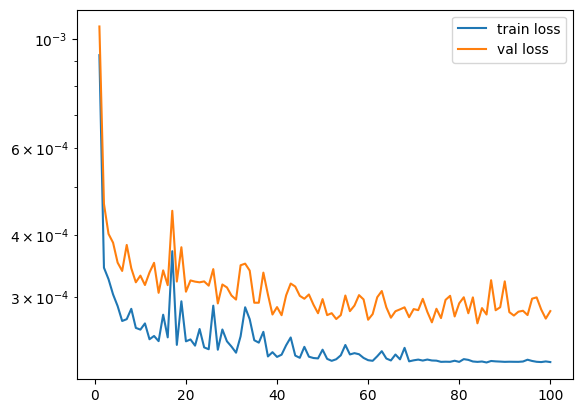

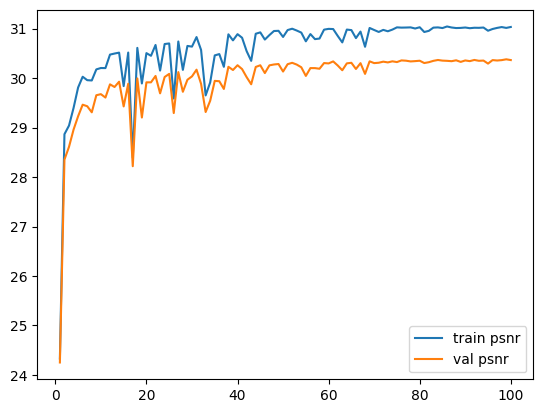

In [ ]:
# Choose a model (pre-trained options: 'dncnn', 'unet', 'rcnn', 'sdensenet')
model = 'dncnn'

# Select the range of noise levels (stdev, relative to intensities in range [0,255])
# used during training (options are 0-10, 0-30, 0-55, 0-100).
l = 0   # lower bound of training range
h = 100 # upper bound of training range

# BF_CNN = load_model(os.path.join(pretrained_base, model, 'bias_free', str(l)+'-'+str(h)+'.pt'))
BF_CNN = load_model_from_scratch(os.path.join(pretrained_base, model, 'bias_free', str(l)+'-'+str(h)+'.pt'))


operation_seed_counter = 0
net_supervised_continous = BF_CNN

net_supervised_continous, train_psnr_continous, val_psnr_continous, train_loss_continous, val_loss_continous = train_network_on_noise_supervised(net_supervised_continous, train_loader, val_loader,
                        add_noise = True,
                        noise_mode = 'poisson',
                        max_epoch = 100,
                        milestone = 100,
                        lr = 1e-4,
                        verbose = True,
                        verbose_freq = 1,
                        plot_loss = True)
#             visualize_filters(net_temp)
net_dict_filename = 'natural_image_net_supervised_continous.pth'
torch.save(net_supervised_continous.cpu().state_dict(),os.path.join(path_to_saved_models, net_dict_filename))

#### Fixed noise

Namespace(data_path='../data/', dataset='bsd400', batch_size=128, model='dncnn', noise_mode='B', noise_std=25, min_noise=100, max_noise=0, lr=0.001, num_epochs=70, valid_interval=1, save_interval=1, seed=0, output_dir='experiments', experiment=None, resume_training=False, restore_file=None, no_save=False, step_checkpoints=False, no_log=True, log_interval=100, no_visual=False, visual_interval=100, no_progress=False, draft=False, dry_run=False, in_channels=1, hidden_size=64, num_layers=20, bias=False, experiment_dir=None, checkpoint_dir=None, log_dir=None, log_file=None)
1 train error:  0.0009910965282469988 val error:  0.001114977914839983 train psnr:  24.03373376451194 val psnr:  23.979545062241286
2 train error:  0.00036429305017615356 val error:  0.000461535113863647 train psnr:  28.604255957436557 val psnr:  28.142821889381004
3 train error:  0.00032807121239602566 val error:  0.00042191681452095507 train psnr:  29.175658135256352 val psnr:  28.615771596362034
4 train error:  0.0002

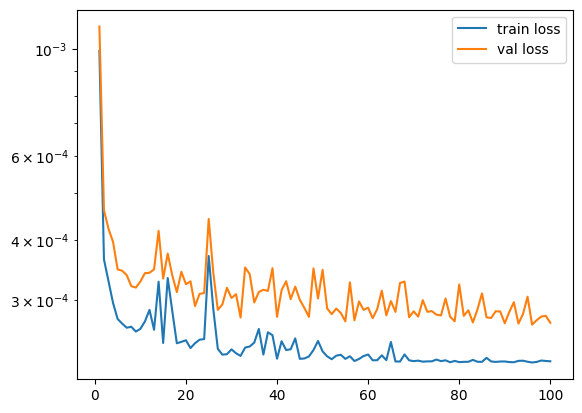

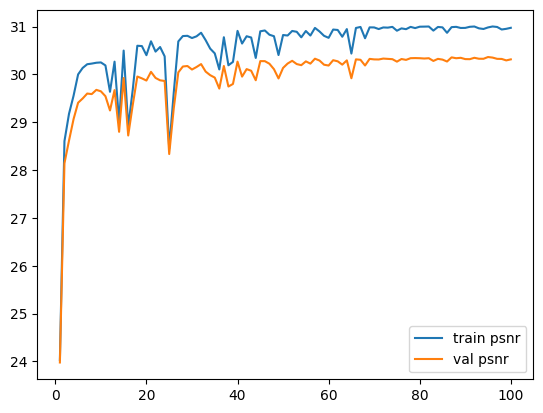

In [ ]:

# Choose a model (pre-trained options: 'dncnn', 'unet', 'rcnn', 'sdensenet')
model = 'dncnn'

# Select the range of noise levels (stdev, relative to intensities in range [0,255])
# used during training (options are 0-10, 0-30, 0-55, 0-100).
l = 0   # lower bound of training range
h = 100 # upper bound of training range

# BF_CNN = load_model(os.path.join(pretrained_base, model, 'bias_free', str(l)+'-'+str(h)+'.pt'))
BF_CNN = load_model_from_scratch(os.path.join(pretrained_base, model, 'bias_free', str(l)+'-'+str(h)+'.pt'))


operation_seed_counter = 0
net_supervised_fixed_noise = BF_CNN

net_supervised_fixed_noise, train_psnr_fixed_noise, val_psnr_fixed_noise, train_loss_fixed_noise, val_loss_fixed_noise = train_network_on_noise_supervised_fixed(net_supervised_fixed_noise, train_loader, val_loader,
                        add_noise = True,
                        noise_mode = 'poisson',
                        max_epoch = 100,
                        milestone = 100,
                        lr = 1e-4,
                        verbose = True,
                        verbose_freq = 1,
                        plot_loss = True)
#             visualize_filters(net_temp)
net_dict_filename = 'natural_image_net_supervised_fixed_noise.pth'
torch.save(net_supervised_fixed_noise.cpu().state_dict(),os.path.join(path_to_saved_models, net_dict_filename))

In [ ]:
def moving_average(data, window_size=5):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')


def plot_combined_losses(train_loss, val_loss, train_loss_dnn, val_loss_dnn, save_path='combined_losses.pdf', title1='DNN without Batch Normalization', title2='DNN with Batch Normalization', title='Combined Losses', y_max=0.2, smooth=False, xlim=100, figsize=(8,8), tick_font_size=14, ylabel='MSE'):
    y_min = 0
    y_max = y_max
    fig, ax = plt.subplots(figsize=figsize)

    if smooth:
        # Apply moving average if smoothing is desired
        train_loss = moving_average(train_loss)
        val_loss = moving_average(val_loss)
        train_loss_dnn = moving_average(train_loss_dnn)
        val_loss_dnn = moving_average(val_loss_dnn)

    # Plotting for the first experiment
    ax.plot(train_loss, label=title1 + ': Train ' + ylabel, color='blue')
    ax.plot(val_loss, label=title1 + ': Validation ' + ylabel, color='blue', linestyle='-.')
    # ax.axhline(y=wiener_star_loss, color='red', linestyle='--', label='Wiener Star Loss')

    # Plotting for the DNN experiment
    ax.plot(train_loss_dnn, label=title2 + ': Train ' + ylabel, color='green')
    ax.plot(val_loss_dnn, label=title2 + ': Validation ' + ylabel, color='green', linestyle='-.')

    # ax.set_title(title, fontsize=16)
    ax.set_xlabel('Epoch', fontsize=14)
    ax.set_ylabel(ylabel, fontsize=14)
    ax.legend(fontsize=16)
    # ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.3), fancybox=True, shadow=True, ncol=2)

    ax.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
    ax.set_ylim(y_min, y_max)
    ax.set_xlim(0, xlim)

    ax.tick_params(axis='both', which='major', labelsize=tick_font_size)


    plt.tight_layout()
    save_path = title1 + title2 + '.png'
    plt.savefig(save_path, dpi=300)
    plt.show()


### Compare training and validation loss

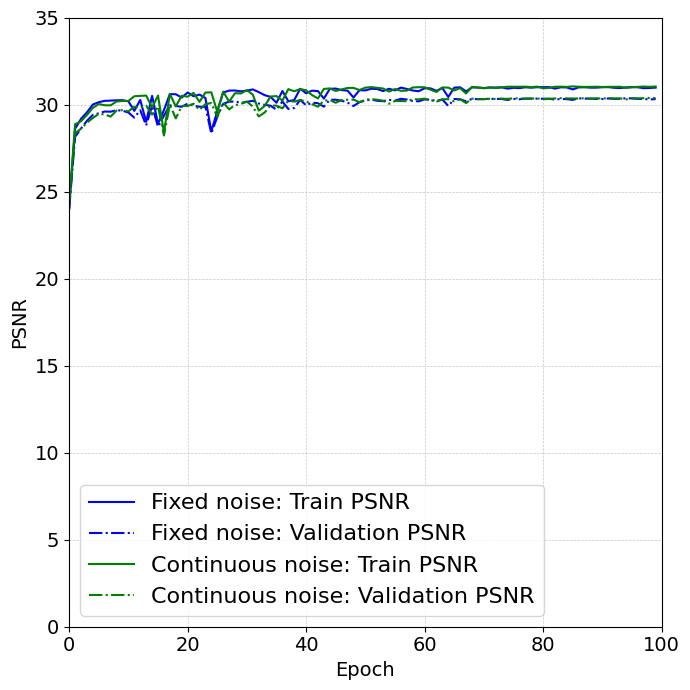

In [ ]:
plot_combined_losses(train_psnr_fixed_noise, val_psnr_fixed_noise, train_psnr_continous, val_psnr_continous, title1='Fixed noise', title2='Continuous noise', y_max=35, smooth=False, xlim=100, figsize=(7,7),ylabel='PSNR')

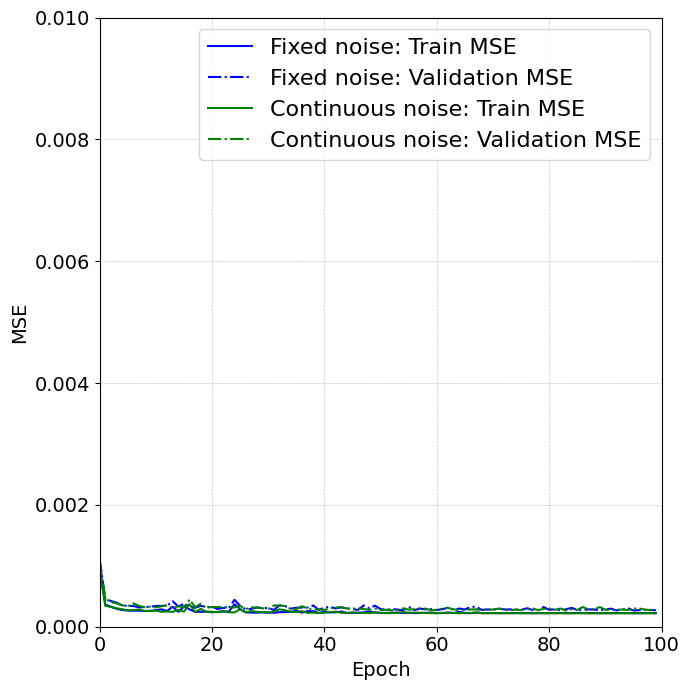

In [ ]:
plot_combined_losses(train_loss_fixed_noise, val_loss_fixed_noise, train_loss_continous, val_loss_continous, title1='Fixed noise', title2='Continuous noise', y_max=0.01, smooth=False, xlim=100, figsize=(7,7))

## Train unsupervised model: Noise2Noise

In [ ]:
def train_network_on_noise2noise(model, train_loader, val_loader,
                            add_noise = False, noise_mode = 'poisson', max_noise = 5e-1, noise_std = 0.1,
                            max_epoch = 50,  milestone = 50, lr=0.001, plot_loss = True, verbose = False,
                            verbose_freq = 100, early_stopping = True, noise_scale=50):
    model = model.to(device)

    optimizer = optim.Adam( filter(lambda p: p.requires_grad, model.parameters()) , lr=lr);
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'max', patience = 5, factor = 0.5)
    criterion = nn.MSELoss()

    train_loss = np.zeros(max_epoch);
    val_loss = np.zeros(max_epoch);

    train_psnr = np.zeros(max_epoch);
    val_psnr = np.zeros(max_epoch);

    best_model = None;
    best_val_loss = np.inf;

    for epoch in range(max_epoch):

#         if epoch > milestone:
#             for param_group in optimizer.param_groups:
#                 param_group["lr"] = lr/10;

        for i, data in enumerate(train_loader):
            optimizer.zero_grad();
            model.train();
#             data = data['image']
            target = data.clone();

            if add_noise:
#                 data = Poisson(data).sample()
                data = data + get_noise(data, mode = noise_mode,noise_std=noise_std, max_noise = max_noise, noise_scale=noise_scale)
                target = target +  get_noise(data, mode = noise_mode,noise_std=noise_std, max_noise = max_noise, noise_scale=noise_scale)

            data = data.to(device)
            target = target.to(device)

            out_train = model(data);
            loss = criterion(out_train, target);
            loss.backward()
            optimizer.step()

        train_loss[epoch], train_psnr[epoch] = validation_error_psnr(model, train_loader,
                                                                add_noise = add_noise);
        val_loss[epoch], val_psnr[epoch] = validation_error_psnr(model, val_loader,
                                                            add_noise = add_noise);
        scheduler.step(val_psnr[epoch])

        if (epoch+1) % verbose_freq == 0 and verbose:
            print(epoch+1, 'train error: ', train_loss[epoch],
                             'val error: ', val_loss[epoch],
                              'train psnr: ', train_psnr[epoch],
                             'val psnr: ', val_psnr[epoch]);

        if val_loss[epoch] < best_val_loss:
            best_model = model.state_dict();
            best_val_loss = val_loss[epoch]

    if early_stopping:
        model.load_state_dict(best_model)

    if plot_loss:
        plt.semilogy(np.arange(1, max_epoch+1), train_loss, label = 'train loss');
        plt.semilogy(np.arange(1, max_epoch+1), val_loss, label = 'val loss')
        plt.legend()
        plt.show()

        plt.plot(np.arange(1, max_epoch+1), train_psnr, label = 'train psnr');
        plt.plot(np.arange(1, max_epoch+1), val_psnr, label = 'val psnr')
        plt.legend()
        plt.show()

    return model, train_psnr, val_psnr

Namespace(data_path='../data/', dataset='bsd400', batch_size=128, model='dncnn', noise_mode='B', noise_std=25, min_noise=100, max_noise=0, lr=0.001, num_epochs=70, valid_interval=1, save_interval=1, seed=0, output_dir='experiments', experiment=None, resume_training=False, restore_file=None, no_save=False, step_checkpoints=False, no_log=True, log_interval=100, no_visual=False, visual_interval=100, no_progress=False, draft=False, dry_run=False, in_channels=1, hidden_size=64, num_layers=20, bias=False, experiment_dir=None, checkpoint_dir=None, log_dir=None, log_file=None)
1 train error:  0.00099832960528632 val error:  0.001131590139120817 train psnr:  24.002197256116435 val psnr:  23.934328886087926
2 train error:  0.0003678343634431561 val error:  0.00045322329737246036 train psnr:  28.511252108210364 val psnr:  28.085047363161703
3 train error:  0.0003249055091291666 val error:  0.0004019123874604702 train psnr:  29.068641738937526 val psnr:  28.619563845042535
4 train error:  0.000302

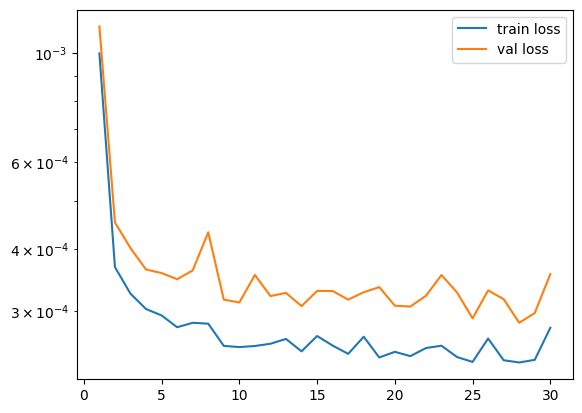

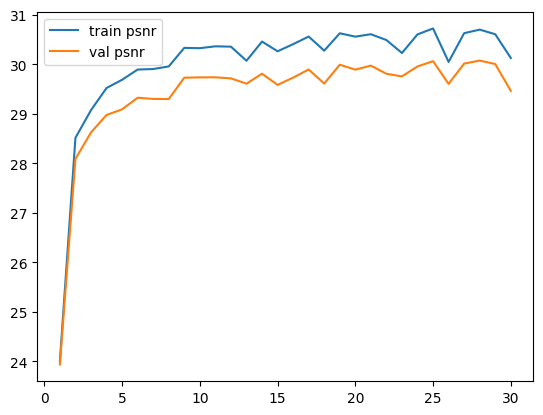

In [ ]:



model = 'dncnn'

# Select the range of noise levels (stdev, relative to intensities in range [0,255])
# used during training (options are 0-10, 0-30, 0-55, 0-100).
l = 0   # lower bound of training range
h = 100 # upper bound of training range

# BF_CNN = load_model(os.path.join(pretrained_base, model, 'bias_free', str(l)+'-'+str(h)+'.pt'))
BF_CNN = load_model_from_scratch(os.path.join(pretrained_base, model, 'bias_free', str(l)+'-'+str(h)+'.pt'))


# operation_seed_counter = 0
net_noise2noise = BF_CNN

net_noise2noise, train_psnr_noise2noise, val_psnr_noise2noise = train_network_on_noise2noise(net_noise2noise, train_loader, val_loader,
                        add_noise = True,
                        noise_mode = 'poisson',
                        max_epoch = 30,
                        milestone = 100,
                        lr = 1e-4,
                        verbose = True,
                        verbose_freq = 1,
                        plot_loss = True)
#             visualize_filters(net_temp)



# validation_dict[kernel_size] = val_psnr_tmpt
plt.show()
print('='*50)

net_dict_filename = 'natural_image_noise2noise.pth'

torch.save(net_noise2noise.cpu().state_dict(),  os.path.join(path_to_saved_models, net_dict_filename))





# Evaluation and visualization

In [ ]:
from utils import *

In [ ]:
pretrained_base = file_root_path + '/bias_free_denoising/pretrained/'
precomputed_base = file_root_path + '/bias_free_denoising/precomputed/'
data_base = file_root_path + '/bias_free_denoising/data/'


## Compare denoising: Wiener/ LinearNet/ DNN

In [48]:
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import numpy as np
import torch
# plt.rcParams['axes.titlesize'] = 16

plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.size'] = 16
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.labelsize'] = 16
plt.rcParams['xtick.labelsize'] = 14
plt.rcParams['ytick.labelsize'] = 14

def save_image(img, filename):
    fig = plt.figure(frameon=False)
    ax = plt.Axes(fig, [0., 0., 1., 1.], )
    ax.set_axis_off()
    fig.add_axes(ax)
    ax.imshow(img, aspect='equal', cmap='gray')
    fig.savefig(filename, bbox_inches='tight', dpi=300)
    plt.close(fig)



def save_fft(img, filename):
    fig = plt.figure(frameon=False)
    ax = plt.Axes(fig, [0., 0., 1., 1.], )
    ax.set_axis_off()
    fig.add_axes(ax)
    ax.imshow(img, aspect='equal', cmap=plt.cm.Blues)
    fig.savefig(filename, bbox_inches='tight', dpi=300)
    plt.close(fig)



def compare_all(source, noise_std, wiener_star, net_linear, unet, figsize=(25, 10), fft_sample=(180, 180),noise_scale=50, output_directory="output_images_mc"):
    noisy = source + get_noise(source, noise_std=noise_std)
#     wavelet_denoised = net(noisy.unsqueeze(0))
    if not os.path.exists(output_directory):
        os.makedirs(output_directory)


    net_linear.to(device)
    unet.to(device)

    linear_denoised = net_linear(noisy.to(device).unsqueeze(0))
    unet_denoised = unet(noisy.to(device).unsqueeze(0))

    source_torch = source.clone().unsqueeze(0)
    source = source.numpy()[0]
    noisy = noisy.numpy()[0]

    source_fft = np.fft.fftshift(np.fft.fft2(source, s=fft_sample))
    noisy_fft = np.fft.fftshift(np.fft.fft2(noisy, s=fft_sample))
    denoised_fft = noisy_fft * wiener_star

    source_ifft = np.clip(np.real(np.fft.ifft2(np.fft.ifftshift(source_fft), s=fft_sample)), 0., 1.)
    noisy_ifft = np.clip(np.real(np.fft.ifft2(np.fft.ifftshift(noisy_fft), s=fft_sample)), 0., 1.)
    denoised_ifft = np.clip(np.real(np.fft.ifft2(np.fft.ifftshift(denoised_fft), s=fft_sample)), 0., 1.)

    psnr_noisy = round(compare_psnr(source_ifft, noisy_ifft, data_range=1.), 2)
    psnr_denoised = round(compare_psnr(source_ifft, denoised_ifft, data_range=1.), 2)
#     psnr_wavelet = round(batch_PSNR(torch.clamp(wavelet_denoised, 0.0, 1.0), source_torch, 1.), 2)
    psnr_linear = round(batch_PSNR(torch.clamp(linear_denoised, 0.0, 1.0), source_torch, 1.), 2)
    psnr_unet = round(batch_PSNR(torch.clamp(unet_denoised, 0.0, 1.0), source_torch, 1.), 2)

    fig, axes = plt.subplots(2, 5, sharex=True, sharey='row', figsize=figsize)

    images = [source_ifft, noisy_ifft, denoised_ifft, tensor_to_image(linear_denoised), tensor_to_image(unet_denoised)]
    titles = ["Source", f"Noisy Image: {psnr_noisy}", f"Wiener Denoised: {psnr_denoised}", f"LinearNet Denoised: {psnr_linear}", f"DNN Denoised: {psnr_unet}"]

    # Display images
    for ax, img, title in zip(axes[0,:], images, titles):
        ax.imshow(img, cmap='gray')
        ax.set_title(title)
        ax.axis('off')
        filename = os.path.join(output_directory, title.replace(" ", "_").replace(":", "") + ".pdf")
        save_image(img, filename)




    # Display the FFTs of the images
    min_values, max_values = [], []
    for ax, image, title in zip(axes[1, :], images,titles):
        fft_display = plot_2d_log_fft(image, ax)  # Assuming this function displays the FFT and returns the image object
#         print(fft_display.get_array().min())
#         print(fft_display.get_array().max())
#         print(type(fft_display))
        min_values.append(fft_display.get_array().min())
        max_values.append(fft_display.get_array().max())
        ax.axis('off')
        filename = os.path.join(output_directory, title.replace(" ", "_").replace(":", "") + "_FFT.pdf")
        print(fft_display.get_array().data.shape)
        save_fft(fft_display.get_array().data,filename)



    # Display colorbar in the 6th column
    min_value, max_value = np.min(min_values), np.max(max_values)
    norm = plt.Normalize(vmin=min_value, vmax=max_value)
    sm = plt.cm.ScalarMappable(cmap=plt.cm.Blues, norm=plt.Normalize(vmin=np.min(min_values), vmax=np.max(max_values)))
    # colorbar_axes = fig.add_axes([0.83, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
    # colorbar = fig.colorbar(sm, cax=colorbar_axes, orientation='vertical', format='%.1f')
    # colorbar.set_label('Magnitude (dB)')
    # colorbar.set_ticks(np.linspace(min_value, max_value, num=10))
#     fig.colorbar(sm, ax=axes[:, -1], orientation='vertical', format='%.1f', aspect=40)
#     axes[0, -1].set_title('Magnitude (dB)')

    fig, ax = plt.subplots(figsize=(2, 4))  # Adjust the width in figsize to make the entire figure wider

    # Remove the axis and figure border
    ax.axis('off')
    for spine in ax.spines.values():
        spine.set_visible(False)

    norm = plt.Normalize(vmin=np.min(min_values), vmax=np.max(max_values))
    sm = plt.cm.ScalarMappable(cmap='Blues', norm=norm)

    # Define a position and size for the colorbar within the figure
    # cbar_ax = fig.add_axes([0.3, 0.15, 0.4, 0.7])  # [left, bottom, width, height]

    # fig.colorbar(sm, cax=cbar_ax, orientation='vertical', format='%.1f')
    # cbar_ax.set_title('Magnitude (dB)')
    # fig.tight_layout()
    # fig.savefig(os.path.join(output_directory, 'colorbar.pdf'), bbox_inches='tight', dpi=300)
    # plt.close(fig)



    plt.tight_layout()
    plt.subplots_adjust(wspace=0.1, hspace=0.1)
    plt.show()
    fig.savefig('comparison_plot_natural_image.pdf', bbox_inches='tight', dpi=300)


In [54]:
# Choose a model (pre-trained options: 'dncnn', 'unet', 'rcnn', 'sdensenet')
model = 'dncnn'

# Select the range of noise levels (stdev, relative to intensities in range [0,255])
# used during training (options are 0-10, 0-30, 0-55, 0-100).
l = 0   # lower bound of training range
h = 100 # upper bound of training range

BF_CNN = load_model(os.path.join(pretrained_base, model, 'bias_free', str(l)+'-'+str(h)+'.pt'))

(256, 256)
(256, 256)
(256, 256)
(256, 256)
(256, 256)


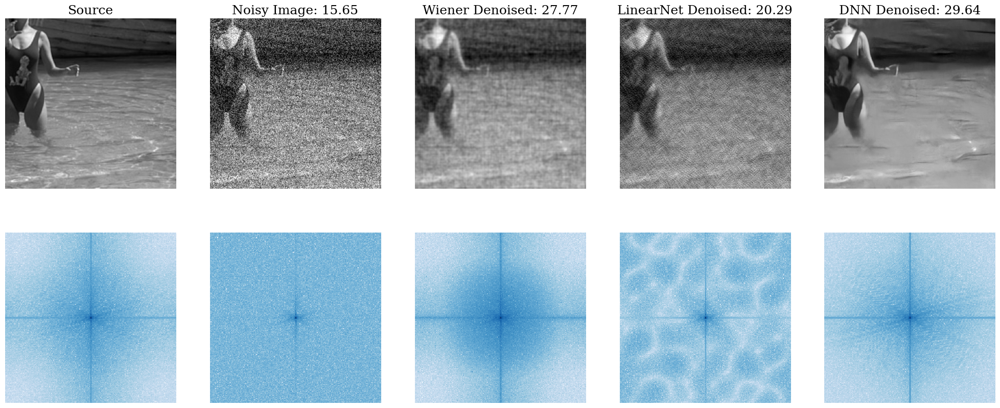

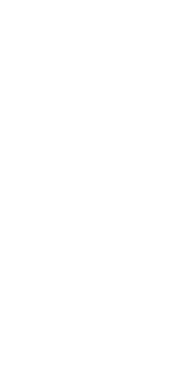

(256, 256)
(256, 256)
(256, 256)
(256, 256)
(256, 256)


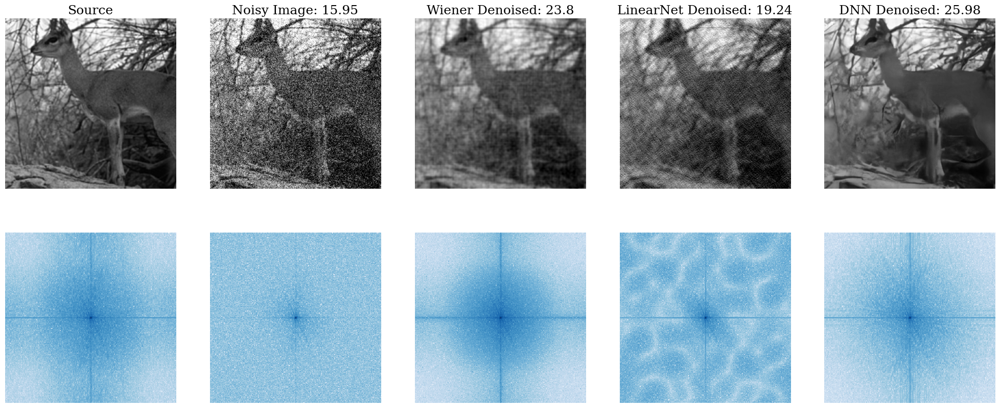

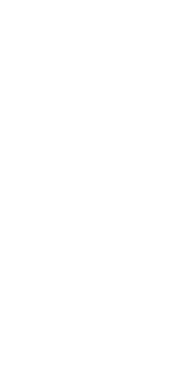

In [61]:
count = 0
output_directory_root = 'output_natural_fig7'
for data in test_loader:
    for idx in range(2):

        image_tensor = data[idx]
        compare_all(image_tensor,noise_std, wiener_star,
                                   onelayer_net_dict[noise_std][9], BF_CNN, fft_sample = (256, 256),noise_scale=noise_scale,output_directory = os.path.join(output_directory_root, str(idx)))
        count += 1
    if count > 1:
        break

## Compare denoising: Wiener/ Unsupervised/ Supervised

In [62]:
def load_model_weight(checkpoint_path, checkpoint_weight):
    state_dict = torch.load(checkpoint_path, map_location=lambda s, l: default_restore_location(s, "cpu"))
    args = argparse.Namespace(**{ **vars(state_dict["args"]), "no_log": True})
    print(args)

    model = models.build_model(args).to(device)
    state_dict_model = torch.load(checkpoint_weight)
    model.load_state_dict(state_dict_model)
    model.eval()
    return model

In [63]:
# Choose a model (pre-trained options: 'dncnn', 'unet', 'rcnn', 'sdensenet')
model = 'dncnn'

l = 0   # lower bound of training range
h = 100 # upper bound of training range

BF_CNN_noise2noise = load_model_weight(os.path.join(pretrained_base, model, 'bias_free', str(l)+'-'+str(h)+'.pt'), os.path.join(file_root_path, 'image_wavelet',  'natural_image_noise2noise.pth'))

Namespace(data_path='../data/', dataset='bsd400', batch_size=128, model='dncnn', noise_mode='B', noise_std=25, min_noise=100, max_noise=0, lr=0.001, num_epochs=70, valid_interval=1, save_interval=1, seed=0, output_dir='experiments', experiment=None, resume_training=False, restore_file=None, no_save=False, step_checkpoints=False, no_log=True, log_interval=100, no_visual=False, visual_interval=100, no_progress=False, draft=False, dry_run=False, in_channels=1, hidden_size=64, num_layers=20, bias=False, experiment_dir=None, checkpoint_dir=None, log_dir=None, log_file=None)


In [64]:
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
# plt.rcParams['axes.titlesize'] = 16

plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.size'] = 16
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.labelsize'] = 16
plt.rcParams['xtick.labelsize'] = 14
plt.rcParams['ytick.labelsize'] = 14


def save_image(img, filename, dpi=300):
    fig = plt.figure(figsize=(img.shape[1] / dpi, img.shape[0] / dpi), dpi=dpi)
    ax = plt.Axes(fig, [0., 0., 1., 1.])
    ax.set_axis_off()
    fig.add_axes(ax)
    ax.imshow(img, aspect='auto', cmap='gray', interpolation='none')
    fig.savefig(filename, dpi=dpi, bbox_inches='tight', pad_inches=0)
    plt.close(fig)


def save_fft(img, filename):
    fig = plt.figure(frameon=False)
    ax = plt.Axes(fig, [0., 0., 1., 1.], )
    ax.set_axis_off()
    fig.add_axes(ax)
    ax.imshow(img, aspect='equal', cmap=plt.cm.Blues)
    fig.savefig(filename, dpi=300)
    plt.close(fig)



def compare_dnn_images(source, noise_std, unet, unet2, wiener_star, figsize=(25, 10), fft_sample=(180, 180), noise_scale=50, output_directory="output_images_mc"):
    noisy = source + get_noise(source, noise_std=noise_std)
#     wavelet_denoised = net(noisy.unsqueeze(0))
    if not os.path.exists(output_directory):
        os.makedirs(output_directory)

    unet.to(device)
    unet2.to(device)


    # linear_denoised = net_linear(noisy.unsqueeze(0))
    unet_denoised = unet(noisy.to(device).unsqueeze(0))
    unet_denoised2 = unet2(noisy.to(device).unsqueeze(0))
    # unet_denoised3 = unet3(noisy.to(device).unsqueeze(0))
    source_torch = source.clone().unsqueeze(0)
    source = source.numpy()[0]
    noisy = noisy.numpy()[0]

    source_fft = np.fft.fftshift(np.fft.fft2(source, s=fft_sample))
    noisy_fft = np.fft.fftshift(np.fft.fft2(noisy, s=fft_sample))
    denoised_fft = noisy_fft * wiener_star

    source_ifft = np.clip(np.real(np.fft.ifft2(np.fft.ifftshift(source_fft), s=fft_sample)), 0., 1.)
    noisy_ifft = np.clip(np.real(np.fft.ifft2(np.fft.ifftshift(noisy_fft), s=fft_sample)), 0., 1.)
    denoised_ifft = np.clip(np.real(np.fft.ifft2(np.fft.ifftshift(denoised_fft), s=fft_sample)), 0., 1.)

    psnr_noisy = round(compare_psnr(source,  noisy, data_range=1.), 2)
    psnr_denoised = round(compare_psnr(source_ifft, denoised_ifft, data_range=1.), 2)
# #     psnr_wavelet = round(batch_PSNR(torch.clamp(wavelet_denoised, 0.0, 1.0), source_torch, 1.), 2)
#     psnr_linear = round(batch_PSNR(torch.clamp(linear_denoised, 0.0, 1.0), source_torch, 1.), 2)
    psnr_unet = round(batch_PSNR(torch.clamp(unet_denoised, 0.0, 1.0), source_torch, 1.), 2)
    psnr_unet2 = round(batch_PSNR(torch.clamp(unet_denoised2, 0.0, 1.0), source_torch, 1.), 2)
    # psnr_unet3 = round(batch_PSNR(torch.clamp(unet_denoised3, 0.0, 1.0), source_torch, 1.), 2)

    fig, axes = plt.subplots(1, 5, sharex=True, sharey='row', figsize=figsize)

    images = [source, noisy,  denoised_ifft, tensor_to_image(unet_denoised), tensor_to_image(unet_denoised2)]
    titles = ["Source", f"Noisy Image: {psnr_noisy}",f"Wiener Denoised: {psnr_denoised}", f"Supervised Denoised: {psnr_unet}", f"noise2noise Denoised: {psnr_unet2}"]

    # Display images
    for ax, img, title in zip(axes, images, titles):
        ax.imshow(img, cmap='gray')
        ax.set_title(title)
        ax.axis('off')
        filename = os.path.join(output_directory, title.replace(" ", "_").replace(":", "") + ".png")
        save_image(img, filename)

    # Remove the axis and figure border
    ax.axis('off')
    for spine in ax.spines.values():
        spine.set_visible(False)

    plt.tight_layout()
    plt.subplots_adjust(wspace=0.1, hspace=0.1)
    plt.show()
    fig.savefig('comparison_plot_natural_image.pdf', bbox_inches='tight', dpi=300)


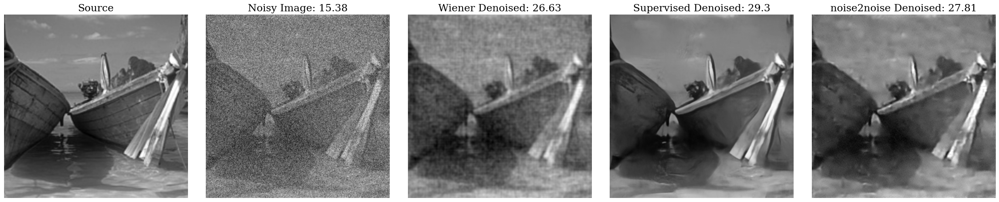

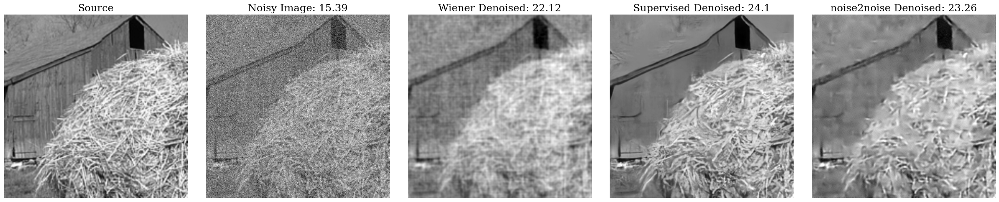

In [65]:
count = 0
output_directory_root = 'output_natural_fig4'
for data in test_loader:
    for idx in range(2):

        image_tensor = data[idx]
        compare_dnn_images(image_tensor,noise_std, BF_CNN, BF_CNN_noise2noise, wiener_star, fft_sample = (256, 256),noise_scale=noise_scale,output_directory = os.path.join(output_directory_root, str(idx)))
        count += 1
    if count > 1:
        break